# WEST NILE VIRUS PREDICTION

## Problem Statement


West Nile virus is most commonly spread to humans through infected mosquitos. Around 20% of people who become infected with the virus develop symptoms ranging from a persistent fever, to serious neurological illnesses that can result in death.

In 2002, the first human cases of West Nile virus were reported in Chicago. By 2004, the City of Chicago and the Chicago Department of Public Health (CDPH) had established a comprehensive surveillance and control program that is still in effect today.

Every week from late spring through the fall, mosquitos in traps across the city are tested for the virus. The results of these tests influence when and where the city will spray airborne pesticides to control adult mosquito populations.

Given weather, location, testing, and spraying data, we are tasked to predict when and where different species of mosquitos will test positive for West Nile virus. A more accurate method of predicting outbreaks of West Nile virus in mosquitos will help the City of Chicago and CPHD more efficiently and effectively allocate resources towards preventing transmission of this potentially deadly virus.

## Executive Summary


In this report, we will consider 4 datasets, namely, df_train, df_test, df_spray and df_weather. 

Once the datasets are imported, we will explore each feature. Feature engineering comes next as we transform the date and weather features. Categorical features are also transformed to dummy variables.

Finally, we will train our model using GridSearch, of which, the best model will be used for our Kaggle submission.

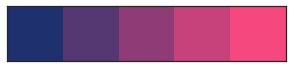

In [100]:
import warnings
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from IPython.display import display, Markdown

# Prevent warnings from distracting the reader
warnings.filterwarnings('ignore')

# Colour scheme and style selected
theme = ['#1F306E', '#553772', '#8F3B76', '#C7417B', '#F5487F']
colors_palette = sns.palplot(sns.color_palette(theme))
plt.style.use('seaborn')
sns.set(style="white", color_codes=True)
sns.set_palette(colors_palette)

# Forces Matplotlib to use high-quality images
ip = get_ipython()
ibe = ip.configurables[-1]
ibe.figure_formats = {'pdf', 'png'}

## IMPORT DATA

We will conduct a descriptive analysis of the West Nile Virus. In addition, we will apply some necessary pre-processing steps to train our model. This report is based on the "West Nile Virus Prediction" via <a href="https://www.kaggle.com/c/predict-west-nile-virus/"> Kaggle </a>

Let us start by loading all the datasets and investigate its structure and attributes:

In [101]:
# Load dataset
df_train = pd.read_csv('./assets/train.csv.zip')
print(f'Training dataset of {df_train.shape[0]} observations and {df_train.shape[1]} features loaded')

df_test = pd.read_csv('./assets/test.csv.zip')
print(f'Testing dataset of {df_test.shape[0]} observations and {df_test.shape[1]} features loaded')

df_spray = pd.read_csv('./assets/spray.csv.zip')
print(f'Spray dataset of {df_spray.shape[0]} observations and {df_spray.shape[1]} features loaded')

df_weather = pd.read_csv('./assets/weather.csv.zip')
print(f'Weather dataset of {df_weather.shape[0]} observations and {df_weather.shape[1]} features loaded')

#df_sample = pd.read_csv('./assets/sampleSubmission.csv.zip')
#print(f'Sample Submission dataset of {df_sample.shape[0]} observations and {df_sample.shape[1]} features loaded')

Training dataset of 10506 observations and 12 features loaded
Testing dataset of 116293 observations and 11 features loaded
Spray dataset of 14835 observations and 4 features loaded
Weather dataset of 2944 observations and 22 features loaded


In [3]:
df_train.head(2)

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0


In [4]:
pd.DatetimeIndex(df_train['Date']). year.unique()

Int64Index([2007, 2009, 2011, 2013], dtype='int64', name='Date')

In [5]:
df_spray.head()

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [6]:
pd.DatetimeIndex(df_spray['Date']). year.unique()

Int64Index([2011, 2013], dtype='int64', name='Date')

In [7]:
df_weather.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,...,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,...,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,M,51,57,0,3,...,,M,M,M,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51,-3,42,47,14,0,...,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52,M,42,47,13,0,...,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56,2,40,48,9,0,...,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9


In [8]:
pd.DatetimeIndex(df_weather['Date']). year.unique()

Int64Index([2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014], dtype='int64', name='Date')

In [9]:
pd.DatetimeIndex(df_test['Date']). year.unique()

Int64Index([2008, 2010, 2012, 2014], dtype='int64', name='Date')

- Train data is available from 2007-2013
- Spray data is availbale from 2011-2013
- Weather data is avialble from 2007-2014

## EXPLORATORY DATA ANALYSIS


### Training Dataset

Overview:

- Observations: 10,506
- Features: 12
- Missing Values: None
- Duplicated Observations: 2,031

In [10]:
# Check the shape of df_train
print(f'Training dataset has {df_train.shape[0]} observations and {df_train.shape[1]} features')
# Check for missing values
print(f'Training dataset have {df_train.isnull().sum().sum()} NaNs')
# Check for duplicates
print(f'Training dataset have {df_train[df_train.duplicated(list(df_train.columns))].shape[0]} duplicated observations')

Training dataset has 10506 observations and 12 features
Training dataset have 0 NaNs
Training dataset have 813 duplicated observations


In [11]:
# display columns in df_train
df_train.columns

Index(['Date', 'Address', 'Species', 'Block', 'Street', 'Trap',
       'AddressNumberAndStreet', 'Latitude', 'Longitude', 'AddressAccuracy',
       'NumMosquitos', 'WnvPresent'],
      dtype='object')

### Date

In [12]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[0]}</b> - {df_train.Date.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.Date.value_counts(normalize=True)}\n')
print()
n_nan = df_train.Date.isnull().sum()
if n_nan > 0:
    print(f'{df_train.Date} has {n_nan} NaNs')

<b>Date</b> - object

Values:

2007-08-01    0.052446
2007-08-15    0.026271
2013-08-01    0.017704
2007-08-21    0.017704
2007-08-24    0.017704
                ...   
2007-10-09    0.002475
2007-05-29    0.002380
2007-09-25    0.002189
2009-06-03    0.001333
2007-08-03    0.000476
Name: Date, Length: 95, dtype: float64




Text(0, 0.5, 'Month of training data collected')

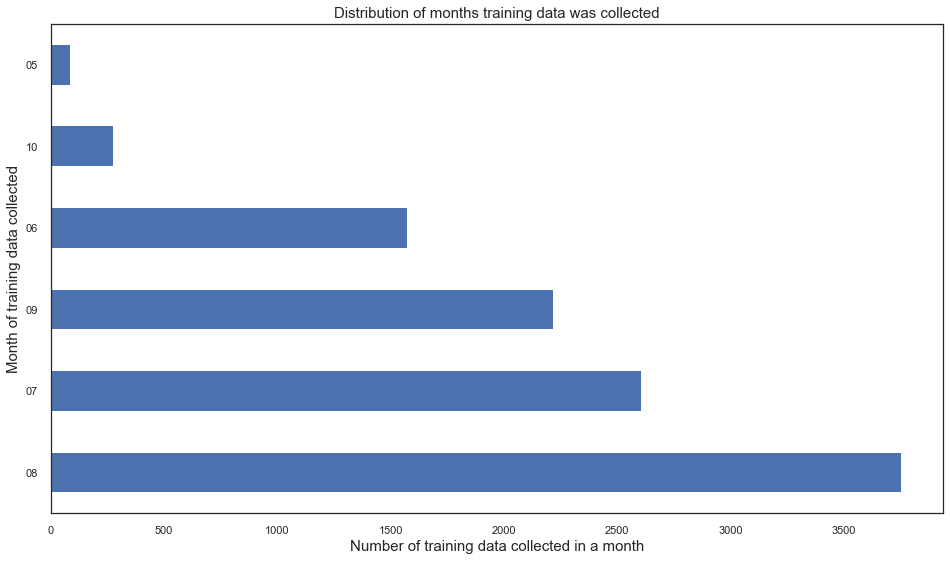

In [13]:
# plot distribution of months collected
df_train['month'] = [x.split('-')[1] for x in df_train['Date']]
plt.figure(figsize = (16,9))
df_train['month'].value_counts().plot(kind='barh',)
plt.title('Distribution of months training data was collected',{'size': 15})
plt.xlabel('Number of training data collected in a month', {'size': 15})
plt.ylabel('Month of training data collected', {'size': 15})

The data shows that the bulk of the training data was collected between 6th to 9th month of the year. This aligns with the summer months in Chicago.

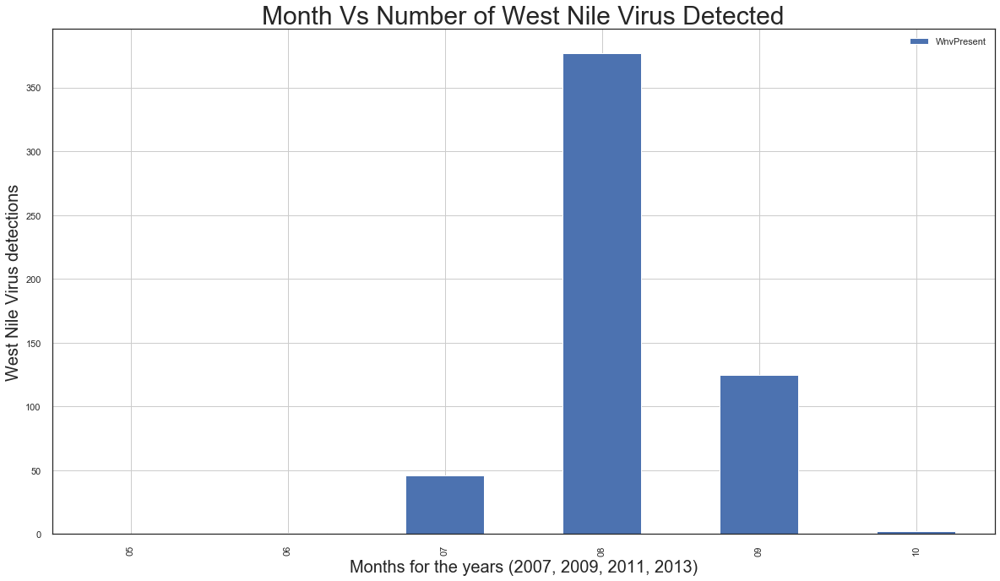

In [14]:
# plot month against west nile virus
df_train[['month', 'WnvPresent']].groupby('month').sum().plot.bar(figsize=(20,11))
plt.title('Month Vs Number of West Nile Virus Detected', fontsize=30)
plt.xlabel('Months for the years (2007, 2009, 2011, 2013)', fontsize =20)
plt.xticks(rotation=90)
plt.ylabel('West Nile Virus detections', fontsize=20)
plt.grid(b = True)

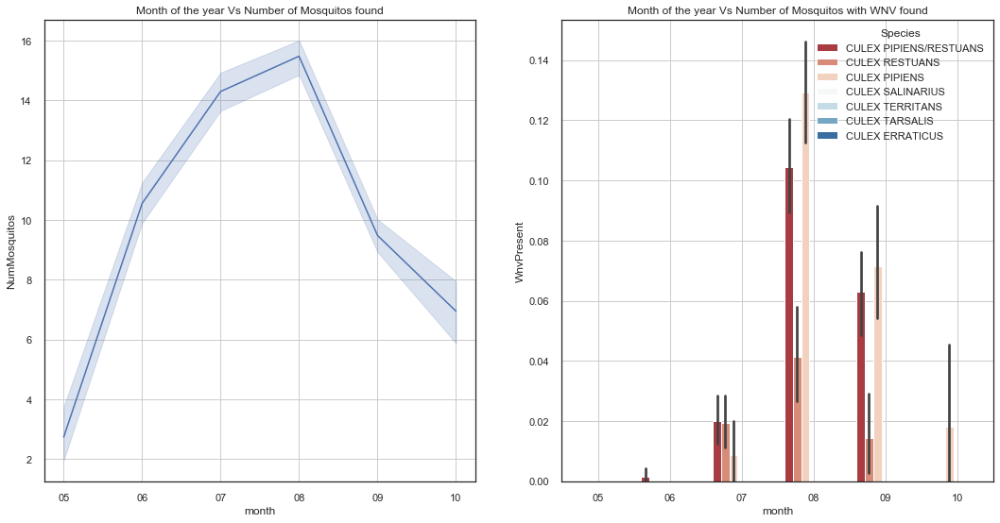

In [15]:
f,ax=plt.subplots(1,2,figsize=(18,9))
#Months Vs NumMosquitos
ax[0].set_title('Month of the year Vs Number of Mosquitos found')
ax[0]=sns.lineplot(x='month', y='NumMosquitos',data=df_train,ax=ax[0],palette="RdBu")
ax[0].grid(b = True)

#Months Vs WnvPresent
ax[1].set_title('Month of the year Vs Number of Mosquitos with WNV found')
ax[1]=sns.barplot(x='month', y='WnvPresent',hue='Species',data=df_train,palette="RdBu",ax=ax[1])
ax[1].grid(b = True)

Over Years of 2007, 2009, 2011, 2013 the highest total number of WNV detections were observed on the mouth of August. And carrier species number also high in summer season of the year.

In addition, over years of 2007, 2009, 2011, 2013 the highest number of mosquitos were observed on the mouth of August with steady increase from month of May then decreased after month of August. And carrier species amount also followed same trend as number of mosquitos.

### Address

In [16]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[1]}</b> - {df_train.Address.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.Address.value_counts(normalize=True)}\n')
print()
n_nan = df_train.Address.isnull().sum()
if n_nan > 0:
    print(f'{df_train.Address} has {n_nan} NaNs')

<b>Address</b> - object

Values:

ORD Terminal 5, O'Hare International Airport, Chicago, IL 60666, USA         0.071388
South Doty Avenue, Chicago, IL, USA                                          0.051590
South Stony Island Avenue, Chicago, IL, USA                                  0.029888
4100 North Oak Park Avenue, Chicago, IL 60634, USA                           0.017609
4200 West 127th Street, Alsip, IL 60803, USA                                 0.017419
                                                                               ...   
3400 West 77th Street, Chicago, IL 60652, USA                                0.000666
5500 South Doctor Martin Luther King Junior Drive, Chicago, IL 60637, USA    0.000476
9600 South Longwood Drive, Chicago, IL 60643, USA                            0.000476
2900 West 85th Street, Chicago, IL 60652, USA                                0.000286
2100 South Hamlin Avenue, Chicago, IL 60623, USA                             0.000190
Name: Address, Length: 138, dtype: float64




In [17]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.set_option('display.width', None)


In [18]:
df_train.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,month
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0,05
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0,05
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0,05
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0,05
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0,05


In [19]:
df_train['state'] = ['IL' if 'IL' in x else 'somewhereelse' for x in df_train['Address']]


In [20]:
df_train.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,month,state
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0,05,IL
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0,05,IL
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0,05,IL
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0,05,IL
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0,05,IL


In [21]:
df_train['state'].value_counts()

IL    10506
Name: state, dtype: int64

### Species

In [22]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[2]}</b> - {df_train.Species.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.Species.value_counts(normalize=True)}\n')
print()
n_nan = df_train.Species.isnull().sum()
if n_nan > 0:
    print(f'{df_train.Species} has {n_nan} NaNs')

<b>Species</b> - object

Values:

CULEX PIPIENS/RESTUANS    0.452313
CULEX RESTUANS            0.260803
CULEX PIPIENS             0.256901
CULEX TERRITANS           0.021131
CULEX SALINARIUS          0.008186
CULEX TARSALIS            0.000571
CULEX ERRATICUS           0.000095
Name: Species, dtype: float64




In [45]:
# # making boolean series for a team name 
# filter1 = df_train['Species']=="CULEX PIPIENS"
  
# # making boolean series for age 
# filter2 = df_train['WnvPresent']==1
  
# # filtering data on basis of both filters 
# df_train.where(filter1 & filter2) 

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,month,state
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
df_train[['Species','WnvPresent','NumMosquitos']].groupby(['Species']).sum()


,WnvPresent,NumMosquitos
Species,,
CULEX ERRATICUS,0,7
CULEX PIPIENS,240,44671
CULEX PIPIENS/RESTUANS,262,66268
CULEX RESTUANS,49,23431
CULEX SALINARIUS,0,145
CULEX TARSALIS,0,7
CULEX TERRITANS,0,510


Text(0, 0.5, 'West Nile Virus detections')

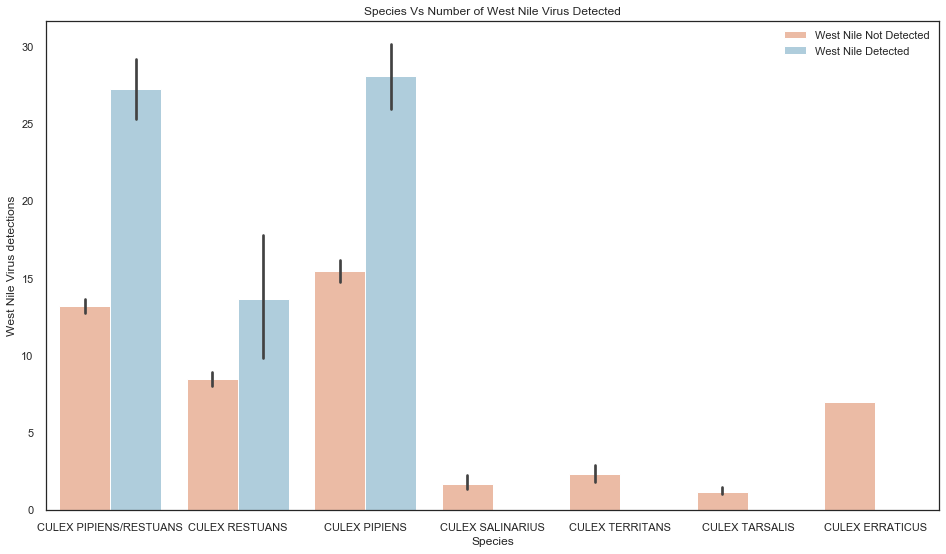

In [24]:
# species of west nile
plt.figure(figsize=(16,9))
ax=sns.barplot(x='Species', y='NumMosquitos', hue='WnvPresent',data=df_train,palette="RdBu")
plt.title("Species Vs Number of West Nile Virus Detected", fontsize='large')
L = plt.legend(loc="upper right")
L.get_texts()[0].set_text('West Nile Not Detected')
L.get_texts()[1].set_text('West Nile Detected')
plt.xlabel("Species", fontsize ='large')
plt.ylabel("West Nile Virus detections", fontsize='large')

Culex Pipiens and Culex Restuans have the highest populations in the training set. Amongst the species represented, the West Nile Virus was present only in Culex Pipiens and Culex Restuans which makes them the carriers as compared to the others. Number of WNV carrier mosquitos matter in spreading illness, not over all number of mosquitos.

### Block

In [25]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[3]}</b> - {df_train.Block.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.Block.value_counts(normalize=True)}\n')
print()
n_nan = df_train.Block.isnull().sum()
if n_nan > 0:
    print(f'{df_train.Block} has {n_nan} NaNs')

<b>Block</b> - int64

Values:

10    0.163906
11    0.070055
12    0.057586
22    0.047592
13    0.032838
37    0.031411
17    0.029031
42    0.028555
70    0.028079
52    0.026366
58    0.023986
50    0.023225
35    0.021797
61    0.021702
25    0.020750
40    0.017990
41    0.017609
33    0.017038
39    0.016848
24    0.015229
89    0.014944
71    0.012659
36    0.012659
51    0.012564
46    0.011612
82    0.011422
65    0.011136
67    0.011041
60    0.011041
91    0.010565
79    0.010375
45    0.009328
28    0.009328
14    0.009233
77    0.008757
43    0.008662
30    0.008567
15    0.008567
63    0.008186
90    0.007329
75    0.006568
38    0.006472
72    0.006282
64    0.005997
48    0.005711
62    0.005330
53    0.004854
21    0.004664
18    0.004093
49    0.003712
81    0.003427
96    0.002951
73    0.002856
68    0.002760
20    0.002380
98    0.002189
93    0.001999
66    0.001999
47    0.001904
27    0.001618
80    0.001237
34    0.000666
55    0.000476
29    0.000286
Name: Block, dtype: float64




- Most of the training data were collected in block 10.



### Street

In [26]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[4]}</b> - {df_train.Street.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.Street.value_counts(normalize=True)}\n')
print()
n_nan = df_train.Street.isnull().sum()
if n_nan > 0:
    print(f'{df_train.Street} has {n_nan} NaNs')

<b>Street</b> - object

Values:

 W OHARE AIRPORT                  0.071388
 S DOTY AVE                       0.051590
 S STONY ISLAND AVE               0.033029
 S ASHLAND AVE                    0.025319
 N OAK PARK AVE                   0.020560
 W 51ST ST                        0.017609
 W 127TH PL                       0.017419
 N PULASKI RD                     0.016467
 N CANNON DR                      0.016372
 E 105TH ST                       0.015229
  W ARMITAGE AVENUE               0.014849
 W 95TH ST                        0.014658
 E 118TH ST                       0.014468
 S KOLMAR                         0.014087
 W 116TH ST                       0.013992
 S CENTRAL AVE                    0.013897
 W ROOSEVELT                      0.013897
 W OHARE                          0.013326
 N MOSELL AVE                     0.013231
 N PITTSBURGH AVE                 0.012659
 S BRANDON                        0.012374
 S TORRENCE AVE                   0.012279
 S KEDZIE AVE                     0.012279
 E 67TH ST 

Most of the traps laid were at O'Hare Airport.



In [102]:
# Do traps stay in the same place at all times?
location_features = ['Address', 'Block', 'Street', 'AddressNumberAndStreet',
                     'Latitude', 'Longitude', 'AddressAccuracy']

train_by_trap = df_train.groupby('Trap')[location_features].nunique()

non_unique_index = [index for index, row in train_by_trap.iterrows()
                    if row.sum() != train_by_trap.shape[1]]

train_by_trap.loc[non_unique_index, :]

,Address,Block,Street,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
Trap,,,,,,,
T009,2,1,2,2,2,2,1
T035,2,2,2,2,2,2,1


In [27]:
# display trap T900
df_train[df_train['Trap'] == "T900"]

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,month,state
3868,2009-05-28,"ORD Terminal 5, O'Hare International Airport, ...",CULEX RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,30,0,05,IL
3869,2009-05-28,"ORD Terminal 5, O'Hare International Airport, ...",CULEX RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,4,0,05,IL
3963,2009-06-03,"ORD Terminal 5, O'Hare International Airport, ...",CULEX PIPIENS/RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,22,0,06,IL
3964,2009-06-03,"ORD Terminal 5, O'Hare International Airport, ...",CULEX PIPIENS/RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,50,0,06,IL
3965,2009-06-03,"ORD Terminal 5, O'Hare International Airport, ...",CULEX PIPIENS/RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,21,0,06,IL
3966,2009-06-03,"ORD Terminal 5, O'Hare International Airport, ...",CULEX PIPIENS/RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,27,0,06,IL
3967,2009-06-03,"ORD Terminal 5, O'Hare International Airport, ...",CULEX PIPIENS/RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,35,0,06,IL
3968,2009-06-03,"ORD Terminal 5, O'Hare International Airport, ...",CULEX PIPIENS/RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,49,0,06,IL
3969,2009-06-03,"ORD Terminal 5, O'Hare International Airport, ...",CULEX PIPIENS/RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,50,0,06,IL
3970,2009-06-03,"ORD Terminal 5, O'Hare International Airport, ...",CULEX RESTUANS,10,W OHARE AIRPORT,T900,"1000 W OHARE AIRPORT, Chicago, IL",41.974689,-87.890615,9,14,0,06,IL


The most used trap is T900, as it is placed at O'Hare airport, which collected the most mosquitos.

In [50]:
df_train[df_train.Trap=='T035']

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,month,state
389,2007-07-11,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,1,0,07,IL
513,2007-07-18,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,1,0,07,IL
561,2007-07-19,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,3,0,07,IL
759,2007-07-27,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,3,0,07,IL
760,2007-07-27,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,1,0,07,IL
1061,2007-08-01,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,6,0,08,IL
1062,2007-08-01,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX PIPIENS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,5,0,08,IL
1602,2007-08-07,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,4,0,08,IL
1603,2007-08-07,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,1,0,08,IL
1954,2007-08-15,"3000 South Hoyne Avenue, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,30,S HOYNE AVE,T035,"3000 S HOYNE AVE, Chicago, IL",41.836644,-87.677737,8,9,0,08,IL


### AddressNumberAndStreet

In [28]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[6]}</b> - {df_train.AddressNumberAndStreet.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.AddressNumberAndStreet.value_counts(normalize=True)}\n')
print()
n_nan = df_train.AddressNumberAndStreet.isnull().sum()
if n_nan > 0:
    print(f'{df_train.AddressNumberAndStreet} has {n_nan} NaNs')

<b>AddressNumberAndStreet</b> - object

Values:

1000  W OHARE AIRPORT, Chicago, IL                  0.071388
1200  S DOTY AVE, Chicago, IL                       0.051590
1000  S STONY ISLAND AVE, Chicago, IL               0.029888
4100  N OAK PARK AVE, Chicago, IL                   0.017609
4200  W 127TH PL, Chicago, IL                       0.017419
2200  N CANNON DR, Chicago, IL                      0.015515
2400  E 105TH ST, Chicago, IL                       0.015229
7000   W ARMITAGE AVENUE, Chicago, IL               0.014849
3700  E 118TH ST, Chicago, IL                       0.014468
1100  S ASHLAND AVE, Chicago, IL                    0.014373
5200  S KOLMAR, Chicago, IL                         0.014087
3500  W 116TH ST, Chicago, IL                       0.013992
1100  W ROOSEVELT, Chicago, IL                      0.013897
5000  S CENTRAL AVE, Chicago, IL                    0.013897
1000  W OHARE, Chicago, IL                          0.013326
7000  N MOSELL AVE, Chicago, IL                     0.013231
3600  N PITTSBURGH AVE, 

Again, the most data was collected at O'Hare airport.



### Latitude

In [29]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[7]}</b> - {df_train.Latitude.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.Latitude.value_counts(normalize=True)}\n')
print()
n_nan = df_train.Latitude.isnull().sum()
if n_nan > 0:
    print(f'{df_train.Latitude} has {n_nan} NaNs')

<b>Latitude</b> - float64

Values:

41.974689    0.071388
41.673408    0.051590
41.726465    0.029888
41.954690    0.017609
41.662014    0.017419
41.921965    0.015515
41.704572    0.015229
41.916265    0.014849
41.680946    0.014468
41.868077    0.014373
41.798697    0.014087
41.682587    0.013992
41.801498    0.013897
41.867108    0.013897
41.957799    0.013326
42.008314    0.013231
41.944869    0.012659
41.740641    0.012374
41.678618    0.012279
41.773215    0.012184
41.899230    0.011993
41.964242    0.011612
41.720848    0.011517
41.986921    0.011136
41.771660    0.011041
41.822536    0.010946
41.868142    0.010851
41.659112    0.010661
41.750498    0.010661
41.732984    0.010565
41.891118    0.010470
41.778297    0.010375
41.991429    0.009994
41.923738    0.009899
41.825610    0.009899
41.801179    0.009804
41.743402    0.009804
41.963976    0.009328
41.803423    0.009328
41.932094    0.009328
41.906638    0.009233
41.846075    0.008852
41.984809    0.008852
41.754676    0.008757
41.878114    0.008662
41.723195 

### Longitude

In [30]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[8]}</b> - {df_train.Longitude.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.Longitude.value_counts(normalize=True)}\n')
print()
n_nan = df_train.Longitude.isnull().sum()
if n_nan > 0:
    print(f'{df_train.Longitude} has {n_nan} NaNs')

<b>Longitude</b> - float64

Values:

-87.890615    0.071388
-87.599862    0.051590
-87.585413    0.029888
-87.800991    0.017609
-87.724608    0.017419
-87.632085    0.015515
-87.565666    0.015229
-87.800515    0.014849
-87.535198    0.014468
-87.666901    0.014373
-87.736812    0.014087
-87.707973    0.013992
-87.763416    0.013897
-87.654224    0.013897
-87.930995    0.013326
-87.777921    0.013231
-87.832763    0.012659
-87.546587    0.012374
-87.559308    0.012279
-87.600880    0.012184
-87.716788    0.011993
-87.757639    0.011612
-87.666014    0.011517
-87.689778    0.011136
-87.703047    0.011041
-87.666343    0.010946
-87.696269    0.010851
-87.605294    0.010661
-87.538693    0.010661
-87.649642    0.010565
-87.654491    0.010470
-87.752411    0.010375
-87.747113    0.009994
-87.726549    0.009899
-87.785288    0.009899
-87.731435    0.009804
-87.679447    0.009804
-87.691810    0.009328
-87.642984    0.009328
-87.700117    0.009328
-87.701431    0.009233
-87.728492    0.008852
-87.716277    0.008852
-87.612922 

### AddressAccuracy

In [31]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[9]}</b> - {df_train.AddressAccuracy.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.AddressAccuracy.value_counts(normalize=True)}\n')
print()
n_nan = df_train.AddressAccuracy.isnull().sum()
if n_nan > 0:
    print(f'{df_train.AddressAccuracy} has {n_nan} NaNs')

<b>AddressAccuracy</b> - int64

Values:

8    0.440510
9    0.378831
5    0.171997
3    0.008662
Name: AddressAccuracy, dtype: float64




70% of the addresses have an address accuracy of 8 and 9, which means 30% are not as accurate.

### NumMosquitos

In [32]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[10]}</b> - {df_train.NumMosquitos.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.NumMosquitos.value_counts(normalize=True)}\n')
print()
n_nan = df_train.NumMosquitos.isnull().sum()
if n_nan > 0:
    print(f'{df_train.NumMosquitos} has {n_nan} NaNs')

<b>NumMosquitos</b> - int64

Values:

1     0.219589
2     0.123739
50    0.096992
3     0.085285
4     0.056444
5     0.046545
6     0.037883
7     0.031030
8     0.023225
9     0.022559
10    0.019608
11    0.016181
13    0.015515
12    0.012564
16    0.012184
14    0.011422
15    0.010661
17    0.010185
18    0.008757
19    0.008186
21    0.008091
20    0.007520
23    0.006568
27    0.006377
37    0.005806
26    0.005425
24    0.005425
22    0.005330
25    0.004759
39    0.004664
29    0.004569
36    0.004474
31    0.004474
30    0.004188
35    0.004093
28    0.004093
46    0.004093
43    0.003712
32    0.003712
47    0.003522
33    0.003427
48    0.003427
49    0.003331
45    0.003331
38    0.003331
34    0.002951
41    0.002951
42    0.002760
40    0.002665
44    0.002380
Name: NumMosquitos, dtype: float64




In [33]:
df_train[df_train['NumMosquitos'] == 50]['AddressNumberAndStreet'].value_counts().head()

1200  S DOTY AVE, Chicago, IL            374
1000  S STONY ISLAND AVE, Chicago, IL    160
1000  W OHARE AIRPORT, Chicago, IL       137
1100  S AVENUE L, Chicago, IL             38
2400  E 105TH ST, Chicago, IL             33
Name: AddressNumberAndStreet, dtype: int64

Most traps show that only 1 or 2 mosquitos were caught, however, the next highest number was 50. 50 is the maximum entry that can be put in, and thus multiple entries were made if there were more than 50 mosquitos. The area with most amount of 50 mosquito entries are S Doty Ave, S Stony Island Ave (Both near a marsh) and W O'Hare Airport.

### WnvPresent

In [34]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_train.columns[11]}</b> - {df_train.WnvPresent.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_train.WnvPresent.value_counts(normalize=True)}\n')
print()
n_nan = df_train.WnvPresent.isnull().sum()
if n_nan > 0:
    print(f'{df_train.WnvPresent} has {n_nan} NaNs')

<b>WnvPresent</b> - int64

Values:

0    0.947554
1    0.052446
Name: WnvPresent, dtype: float64




The dataset is highly imbalanced, where the WNV present mosquitos are only present in 5% of the cases.



In [51]:
#labels = df_train.WnvPresent.values

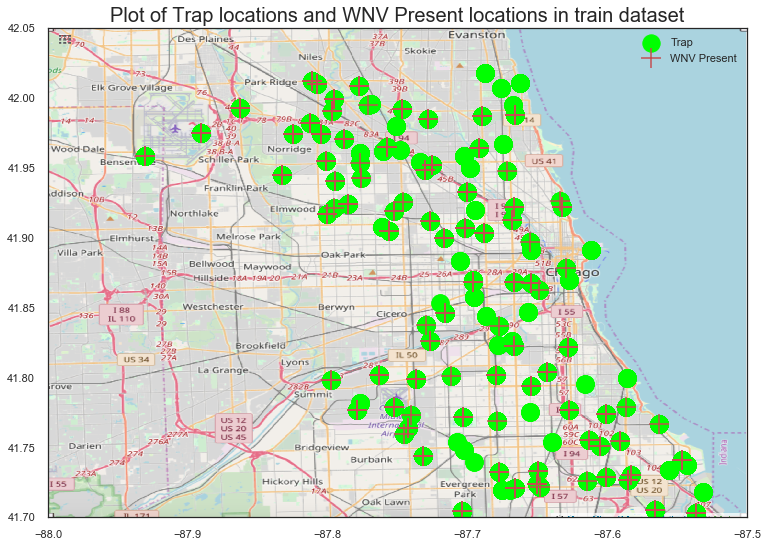

In [147]:
# display df_train distribution
mapdata = plt.imread('./images/map1.png')
fig, ax = plt.subplots(figsize = (16,9))
temp_df=df_train[df_train['WnvPresent']==0]
ax.scatter(temp_df.Longitude, temp_df.Latitude, zorder=1, c = 'lime', s=300, label = 'Trap')
temp_df=df_train[df_train['WnvPresent']==1]
ax.scatter(temp_df.Longitude, temp_df.Latitude, zorder=1, c='r', s=400,marker='+', label= 'WNV Present')
ax.set_title('Plot of Trap locations and WNV Present locations in train dataset', size = 20)
BBox=(-88,-87.5,41.7,42.05)
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(mapdata, zorder=0, extent = BBox, aspect= 'equal');
ax.legend()

## Spray Dataset

In [53]:
# Check the shape of df_spray
print(f'Training dataset has {df_spray.shape[0]} observations and {df_spray.shape[1]} features')
# Check for missing values
print(f'Training dataset have {df_spray.isnull().sum().sum()} NaNs')
# Check for duplicates
print(f'Training dataset have {df_spray[df_spray.duplicated(list(df_spray.columns))].shape[0]} duplicated observations')

Training dataset has 14835 observations and 4 features
Training dataset have 584 NaNs
Training dataset have 541 duplicated observations


### Date

In [55]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_spray.columns[0]}</b> - {df_spray.Date.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_spray.Date.value_counts(normalize=True)}\n')
print()
n_nan = df_spray.Date.isnull().sum()
if n_nan > 0:
    print(f'{df_spray.Date} has {n_nan} NaNs')

<b>Date</b> - object

Values:

2013-08-15    0.179845
2013-08-29    0.155174
2013-07-17    0.148433
2011-09-07    0.142501
2013-07-25    0.108325
2013-08-22    0.106977
2013-08-08    0.080553
2013-09-05    0.062285
2013-08-16    0.009505
2011-08-29    0.006404
Name: Date, dtype: float64




In [56]:
df_spray.Date.value_counts()

2013-08-15    2668
2013-08-29    2302
2013-07-17    2202
2011-09-07    2114
2013-07-25    1607
2013-08-22    1587
2013-08-08    1195
2013-09-05     924
2013-08-16     141
2011-08-29      95
Name: Date, dtype: int64

The bulk of the sprays took place in 2013, while there were only 2 sessions of spray in 2011.

### Time

In [58]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_spray.columns[1]}</b> - {df_spray.Time.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_spray.Time.value_counts(normalize=True)}\n')
print()
n_nan = df_spray.Time.isnull().sum()
if n_nan > 0:
    print(f'{df_spray.Time} has {n_nan} NaNs')

<b>Time</b> - object

Values:

7:44:32 PM     0.037962
9:31:27 PM     0.000351
8:58:26 PM     0.000351
8:58:56 PM     0.000351
9:40:27 PM     0.000351
8:57:56 PM     0.000351
8:55:46 PM     0.000351
8:59:06 PM     0.000351
9:38:27 PM     0.000351
8:55:36 PM     0.000351
9:35:47 PM     0.000351
8:55:26 PM     0.000351
9:37:27 PM     0.000351
8:57:46 PM     0.000351
9:05:56 PM     0.000351
9:38:57 PM     0.000281
8:28:06 PM     0.000281
10:01:35 PM    0.000281
8:25:41 PM     0.000281
9:03:46 PM     0.000281
9:13:46 PM     0.000281
8:46:35 PM     0.000281
8:56:35 PM     0.000281
9:14:55 PM     0.000281
9:39:27 PM     0.000281
9:33:37 PM     0.000281
8:59:36 PM     0.000281
9:19:35 PM     0.000281
8:34:06 PM     0.000281
8:59:45 PM     0.000281
8:31:26 PM     0.000281
9:10:46 PM     0.000281
9:18:45 PM     0.000281
8:25:16 PM     0.000281
9:07:25 PM     0.000281
8:39:06 PM     0.000281
8:57:15 PM     0.000281
8:25:21 PM     0.000281
9:05:36 PM     0.000281
9:21:46 PM     0.000281
9:31:07 PM     0.000281
8:27:31 PM     0

In [59]:
df_spray[df_spray['Time'] == "7:44:32 PM"]

,Date,Time,Latitude,Longitude
489,2011-09-07,7:44:32 PM,41.98646,-87.794225
490,2011-09-07,7:44:32 PM,41.98646,-87.794225
491,2011-09-07,7:44:32 PM,41.98646,-87.794225
492,2011-09-07,7:44:32 PM,41.98646,-87.794225
493,2011-09-07,7:44:32 PM,41.98646,-87.794225
494,2011-09-07,7:44:32 PM,41.98646,-87.794225
495,2011-09-07,7:44:32 PM,41.98646,-87.794225
496,2011-09-07,7:44:32 PM,41.98646,-87.794225
497,2011-09-07,7:44:32 PM,41.98646,-87.794225
498,2011-09-07,7:44:32 PM,41.98646,-87.794225


The highest amount of repeats were at 7.44pm. However upon closer inspection, it is uncertain if it was logging error or not as there were 541 rows that were similar. Might be an area covered that has the center of 41.98646, -87.794225

### Latitude

In [61]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_spray.columns[2]}</b> - {df_spray.Latitude.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_spray.Latitude.value_counts(normalize=True)}\n')
print()
n_nan = df_spray.Latitude.isnull().sum()
if n_nan > 0:
    print(f'{df_spray.Latitude} has {n_nan} NaNs')

<b>Latitude</b> - float64

Values:

41.986460    0.036468
41.995396    0.000741
41.982772    0.000674
41.994484    0.000607
41.985652    0.000607
41.984884    0.000539
41.993524    0.000539
41.996932    0.000539
41.984068    0.000539
41.995012    0.000472
41.994436    0.000472
41.992660    0.000472
41.986372    0.000472
41.993332    0.000472
41.993428    0.000472
41.992612    0.000404
41.996500    0.000404
41.992372    0.000404
41.996020    0.000404
41.996980    0.000404
41.993476    0.000404
41.948470    0.000337
41.982676    0.000337
41.983588    0.000337
41.996884    0.000337
41.982820    0.000337
41.988196    0.000337
41.985268    0.000337
41.993380    0.000337
41.989828    0.000337
41.996452    0.000337
41.983492    0.000270
41.919222    0.000270
41.985604    0.000270
41.986900    0.000270
41.715882    0.000270
41.994244    0.000270
41.718048    0.000270
41.951712    0.000270
41.991700    0.000270
41.940962    0.000270
41.985556    0.000270
41.994388    0.000270
41.984452    0.000270
41.990644    0.000270
41.984980 

### Longitude

In [64]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_spray.columns[3]}</b> - {df_spray.Longitude.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_spray.Longitude.value_counts(normalize=True)}\n')
print()
n_nan = df_spray.Longitude.isnull().sum()
if n_nan > 0:
    print(f'{df_spray.Longitude} has {n_nan} NaNs')


<b>Longitude</b> - float64

Values:

-87.794225    0.036468
-87.806911    0.000607
-87.806863    0.000607
-87.816751    0.000472
-87.805711    0.000404
-87.805615    0.000404
-87.810415    0.000337
-87.808351    0.000337
-87.811567    0.000337
-87.813727    0.000337
-87.813199    0.000337
-87.811855    0.000337
-87.806959    0.000337
-87.814111    0.000270
-87.798775    0.000270
-87.810319    0.000270
-87.803695    0.000270
-87.705312    0.000270
-87.808255    0.000270
-87.710883    0.000270
-87.812767    0.000270
-87.809407    0.000270
-87.811903    0.000270
-87.815983    0.000270
-87.815188    0.000270
-87.799762    0.000202
-87.812017    0.000202
-88.095143    0.000202
-87.770608    0.000202
-87.733588    0.000202
-87.811523    0.000202
-87.713365    0.000202
-87.811951    0.000202
-87.714575    0.000202
-87.709215    0.000202
-87.817598    0.000202
-87.773412    0.000202
-87.816991    0.000202
-87.804175    0.000202
-87.720200    0.000202
-87.723613    0.000202
-87.715822    0.000202
-87.798805    0.000202
-87.715245 

The longitude and latitude most mentioned in this dataset is 41.98646, -87.794225, which is where the most of the sprays happened at 7.44PM. This might be an area covered that has the center of 41.98646, -87.794225

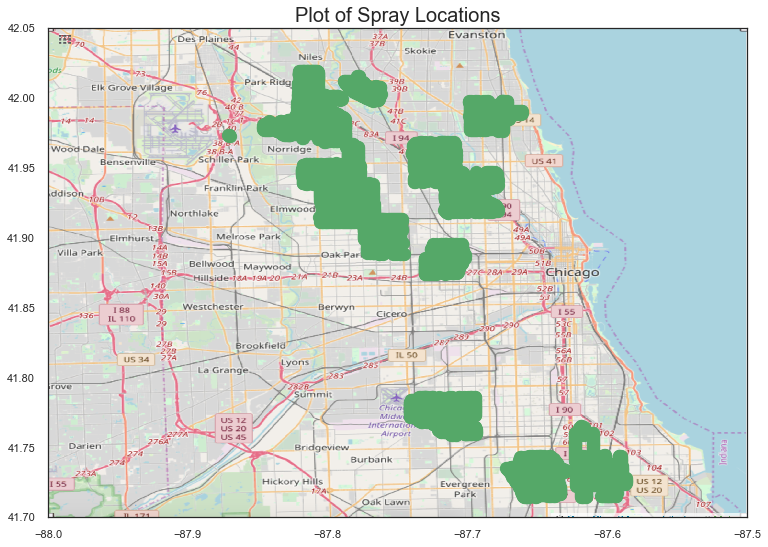

In [146]:
mapdata = plt.imread('./images/map1.png')
fig, ax = plt.subplots(figsize = (16,9))
ax.scatter(df_spray.Longitude, df_spray.Latitude, zorder=1, c= 'g', s=150)
ax.set_title('Plot of Spray Locations', size = 20)
BBox=(-88,-87.5,41.7,42.05)
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(mapdata, zorder=0, extent = BBox, aspect= 'equal');

As shown in the map above, only a small subset of places were chosen for spraying. In addition, the places chosen were not demarcated by suburb borders. 

Also, this dataset has a large proportion of duplicates and possibly have wrong entries.

Text(0.69, 0.45, 'Only 5.24% of observations\nare from the positive class (1),\nie. WNV present')

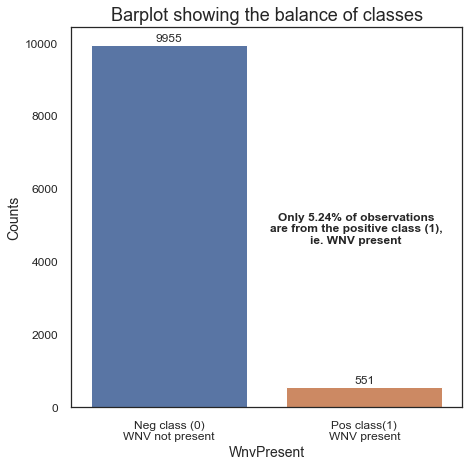

In [65]:
# Plotting the balance of classes on a countplot.

neg_class_count = df_train['WnvPresent'].value_counts()[0]
pos_class_count = df_train['WnvPresent'].value_counts()[1]
pos_class_pct = df_train['WnvPresent'].value_counts(normalize=True)[1] * 100

plt.figure(figsize=(7,7))

ax = sns.countplot(x='WnvPresent', data=df_train)

ax.set_xticklabels(['Neg class (0) WNV not present', 'Pos class(1) WNV present'])
ax.tick_params(axis='both', labelsize=12)

plt.xlabel("WnvPresent", fontsize=14)
plt.ylabel("Counts", fontsize=14)

plt.title("Barplot showing the balance of classes", fontsize=18)

plt.text(x=0, y=neg_class_count+100, s=str(neg_class_count), fontsize=12, ha='center')
plt.text(x=1, y=pos_class_count+100, s=str(pos_class_count), fontsize=12, ha='center')

plt.figtext(x=0.69, 
            y=0.45, 
            s=f"Only {round(pos_class_pct, 2)}% of observations\nare from the positive class (1),\nie. WNV present", 
            fontsize=12, 
            fontweight='semibold',
            ha='center'
           )


As seen above, the classes are very unbalanced. Of the 9955 observations, only 551 (5.24%) are from the positive class, ie. the West Nile Virus is present (WnvPresent = 1). 7847 (94.6%) observations are from the negative class, ie. West Nile Virus is not present (WnvPresent = 0).

Setting a baseline accuracy of 94.6% using the current balance of classes would not serve our purpose in this case. If a baseline accuracy of 94.6% is set, it would imply that we can predict all observations to be West Nile Virus not present, and we would be correct 94.6% of the time. However, this would not help us in predicting the cases when the virus is actually present.

So, in order to model the data in this case, we will have to explore potential ways to balance the two classes before modelling.

## Weather Dataset

Overview:

- Observations: 2,944
- Features: 22
- Missing Values: None
- Duplicated Observations: None

In [68]:
# Check the shape of df_train
print(f'Training dataset has {df_weather.shape[0]} observations and {df_weather.shape[1]} features')
# Check for missing values
print(f'Training dataset have {df_weather.isnull().sum().sum()} NaNs')
# Check for duplicates
print(f'Training dataset have {df_weather[df_weather.duplicated(list(df_weather.columns))].shape[0]} duplicated observations')

Training dataset has 2944 observations and 22 features
Training dataset have 0 NaNs
Training dataset have 0 duplicated observations


### Station

In [69]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[0]}</b> - {df_weather.Station.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Station.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Station.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Station} has {n_nan} NaNs')

<b>Station</b> - int64

Values:

1    0.5
2    0.5
Name: Station, dtype: float64




The Stations can be exactly split into half into station 1 and 2

### Date

In [71]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[1]}</b> - {df_weather.Date.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Date.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Date.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Date} has {n_nan} NaNs')

<b>Date</b> - object

Values:

2009-05-29    0.000679
2014-09-07    0.000679
2011-08-17    0.000679
2011-05-25    0.000679
2014-07-28    0.000679
2014-10-21    0.000679
2007-09-13    0.000679
2011-05-29    0.000679
2013-07-25    0.000679
2011-05-12    0.000679
2007-09-15    0.000679
2009-06-28    0.000679
2013-06-23    0.000679
2013-06-13    0.000679
2012-10-05    0.000679
2009-08-04    0.000679
2008-06-26    0.000679
2010-09-21    0.000679
2014-09-20    0.000679
2011-05-30    0.000679
2008-10-19    0.000679
2008-07-14    0.000679
2008-05-10    0.000679
2008-08-17    0.000679
2008-10-21    0.000679
2011-07-09    0.000679
2013-05-31    0.000679
2008-08-27    0.000679
2013-10-06    0.000679
2007-05-30    0.000679
2014-07-12    0.000679
2007-09-22    0.000679
2008-07-15    0.000679
2011-06-09    0.000679
2007-10-14    0.000679
2010-05-01    0.000679
2008-07-27    0.000679
2011-06-10    0.000679
2011-06-05    0.000679
2007-05-17    0.000679
2007-05-22    0.000679
2013-09-22    0.000679
2009-09-18    0.000679
2007-09-14 

The weather dataset shows an even spread of all dates.

### Tmax

In [73]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[2]}</b> - {df_weather.Tmax.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Tmax.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Tmax.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Tmax} has {n_nan} NaNs')

<b>Tmax</b> - int64

Values:

84     0.043478
79     0.041101
82     0.040082
81     0.039742
83     0.037024
80     0.036345
85     0.036345
86     0.034307
77     0.033967
87     0.032948
88     0.030910
74     0.028872
78     0.028533
89     0.028193
75     0.026834
76     0.026834
72     0.024457
70     0.024117
73     0.022079
71     0.021739
90     0.021060
67     0.021060
91     0.020720
69     0.020380
68     0.020380
66     0.016984
60     0.016984
65     0.015625
63     0.014606
62     0.014606
61     0.013927
92     0.013587
64     0.013247
93     0.011549
59     0.010530
55     0.009851
56     0.009511
94     0.009511
57     0.009171
58     0.008832
53     0.008492
54     0.007812
50     0.006454
51     0.006114
95     0.005435
52     0.004416
49     0.004076
96     0.003736
48     0.003736
46     0.003057
47     0.003057
97     0.002038
44     0.001698
98     0.001698
45     0.001698
99     0.001698
101    0.001359
100    0.001019
102    0.000679
103    0.000679
104    0.000340
41     0.000340
42     0

Text(0, 0.5, 'Count')

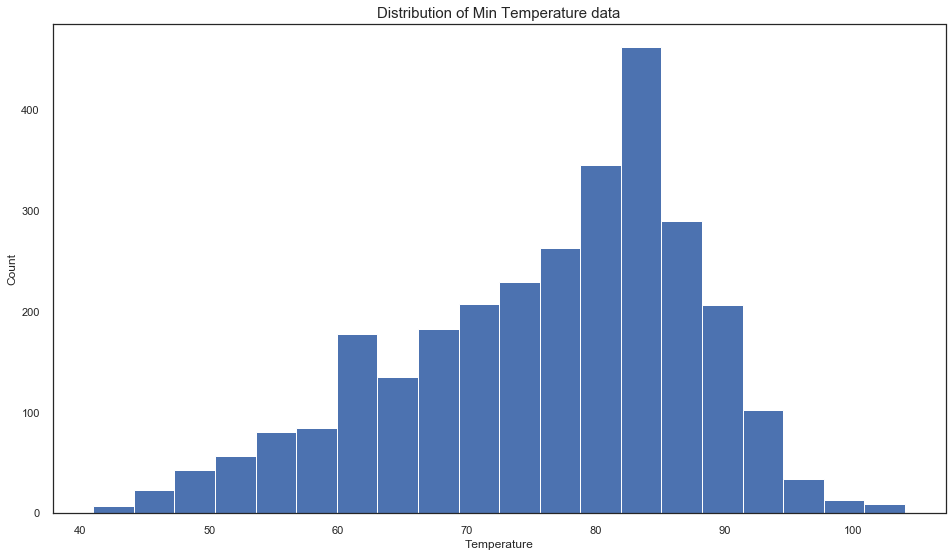

In [74]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['Tmax'], bins = 20)
plt.title('Distribution of Min Temperature data', size = 15)
plt.xlabel('Temperature')
plt.ylabel('Count')

In [75]:
print(df_weather['Tmax'].mean(), df_weather['Tmax'].min(), df_weather['Tmax'].max())

76.16610054347827 41 104


During the period of May to October, the average Tmax is about 76, while the Min-Max is 41 - 104. However, the highest proporition of temperatures lad around the 79 - 84 mark, suggesting that the distribution of temperatures is positively skewed.



### Tmin

In [76]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[3]}</b> - {df_weather.Tmin.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Tmin.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Tmin.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Tmin} has {n_nan} NaNs')

<b>Tmin</b> - int64

Values:

63    0.041101
65    0.037704
60    0.037024
61    0.036005
62    0.035666
66    0.034986
68    0.034986
57    0.034986
64    0.034307
59    0.033967
56    0.033288
69    0.032269
71    0.032269
58    0.031929
70    0.030571
67    0.030231
54    0.027514
49    0.026495
52    0.025136
50    0.024457
55    0.024117
53    0.024117
47    0.023438
44    0.020041
46    0.019701
43    0.019701
51    0.019361
48    0.018682
45    0.018682
72    0.016984
42    0.015625
73    0.015625
41    0.012908
40    0.011209
39    0.009851
74    0.009851
75    0.009511
38    0.007473
37    0.007133
36    0.006793
77    0.006793
34    0.004076
35    0.003736
33    0.003397
79    0.003057
31    0.002378
32    0.002378
29    0.002038
76    0.002038
78    0.001359
80    0.001019
81    0.001019
82    0.000679
83    0.000340
Name: Tmin, dtype: float64




Text(0, 0.5, 'Count')

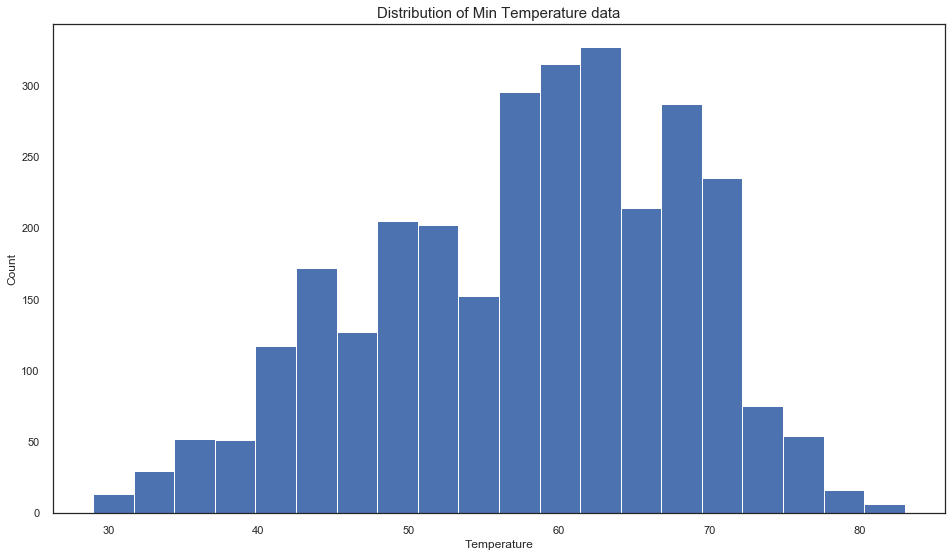

In [77]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['Tmin'], bins = 20)
plt.title('Distribution of Min Temperature data', size = 15)
plt.xlabel('Temperature')
plt.ylabel('Count')

In [78]:
print(df_weather['Tmin'].mean(), df_weather['Tmin'].min(), df_weather['Tmin'].max())

57.81046195652174 29 83


The average Tmin is 57 degrees, while the min - max is 29 - 83 degrees. However, the larger proportion of temperatures are between 60-68 degrees. This might suggest that the Tmin data is slightly positively skewed.

### Tavg

In [79]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[4]}</b> - {df_weather.Tavg.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Tavg.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Tavg.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Tavg} has {n_nan} NaNs')

<b>Tavg</b> - object

Values:

73    0.046875
70    0.039742
77    0.039742
75    0.037364
71    0.037024
74    0.036345
72    0.035326
69    0.034986
78    0.034647
76    0.033967
68    0.033628
79    0.033288
66    0.031590
67    0.030231
61    0.029891
64    0.029212
65    0.028533
80    0.028533
63    0.027514
57    0.022758
62    0.022418
60    0.020720
50    0.019361
81    0.018682
53    0.016644
58    0.016644
54    0.016304
82    0.016304
55    0.016304
52    0.015625
56    0.015625
59    0.015285
51    0.012228
83    0.011549
49    0.009851
45    0.009511
47    0.008152
46    0.008152
84    0.007133
44    0.006454
48    0.005774
85    0.005435
86    0.005435
42    0.005095
43    0.004076
M     0.003736
87    0.003057
41    0.002378
40    0.001698
88    0.001359
39    0.001359
91    0.001359
89    0.001359
37    0.000679
38    0.000679
90    0.000679
36    0.000679
94    0.000340
93    0.000340
92    0.000340
Name: Tavg, dtype: float64




In [81]:
df_weather.Tavg.unique()
df_weather[df_weather['Tavg']== 'M']['Tavg'].count()

11

In [103]:
df_weather['Tavg'] = df_weather['Tavg'].replace('M', np.nan)
df_weather['Tavg'] = [float(x) for x in df_weather['Tavg']]
df_weather['Tavg'].unique()

array([67., 68., 51., 52., 56., 58., nan, 60., 59., 65., 70., 69., 71.,
       61., 55., 57., 73., 72., 53., 62., 63., 74., 75., 78., 76., 77.,
       66., 80., 64., 81., 82., 79., 85., 84., 83., 50., 49., 46., 48.,
       45., 54., 47., 44., 40., 41., 38., 39., 42., 37., 43., 86., 87.,
       89., 92., 88., 91., 93., 94., 90., 36.])

Text(0, 0.5, 'Count')

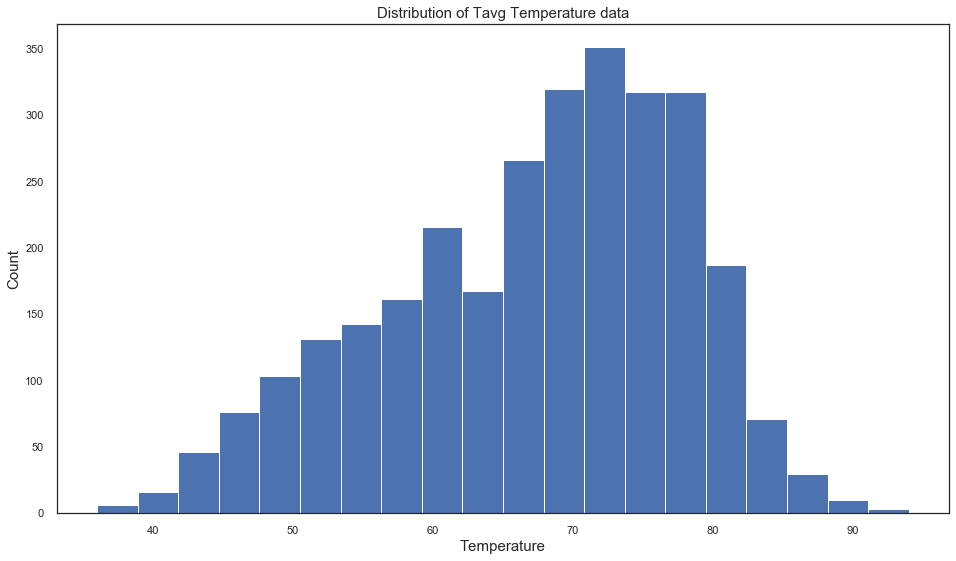

In [104]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['Tavg'], bins = 20)
plt.title('Distribution of Tavg Temperature data', size = 15)
plt.xlabel('Temperature', size = 15)
plt.ylabel('Count', size = 15)

The Tavg data contains 11 missing data. Of the valid dataset, the highest proportion of Tavg lies between 70 - 77 degrees. However, the mean calculated is 67 degrees. This would mean that the weather data is positively skewed.

### Depart

In [82]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[5]}</b> - {df_weather.Depart.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Depart.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Depart.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Depart} has {n_nan} NaNs')

<b>Depart</b> - object

Values:

M      0.500000
 2     0.031590
-1     0.028533
-2     0.027174
 5     0.026155
 1     0.025815
 7     0.025815
 3     0.025476
 0     0.025136
-3     0.024457
 4     0.024117
 6     0.022758
 8     0.020041
-5     0.019361
-4     0.019022
-6     0.016984
 9     0.015965
10     0.015625
-8     0.014606
-7     0.010190
11     0.009511
12     0.009511
-9     0.008492
13     0.007812
-10    0.007473
14     0.007473
15     0.005095
16     0.004076
-11    0.003397
-12    0.002717
17     0.002378
-14    0.002038
18     0.002038
-13    0.001698
19     0.001359
20     0.001359
22     0.001019
-16    0.001019
-15    0.001019
-17    0.000679
21     0.000679
23     0.000340
Name: Depart, dtype: float64




The Departure from normal shows that there is a large proportion of missing values.

### DewPoint

In [83]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[6]}</b> - {df_weather.DewPoint.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.DewPoint.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.DewPoint.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.DewPoint} has {n_nan} NaNs')

<b>DewPoint</b> - int64

Values:

59    0.043478
54    0.042459
55    0.038723
60    0.038383
61    0.037364
52    0.033967
56    0.033628
53    0.033288
65    0.032948
62    0.030910
51    0.030571
50    0.030231
67    0.029891
63    0.029212
57    0.028872
49    0.027853
46    0.025815
66    0.025136
58    0.024796
69    0.023438
47    0.022758
64    0.022758
68    0.022079
48    0.021399
43    0.020720
45    0.020041
44    0.019701
40    0.019361
39    0.018003
41    0.017323
70    0.015285
38    0.014606
42    0.014606
71    0.012568
37    0.012568
36    0.010530
35    0.009851
34    0.009171
31    0.007812
30    0.007473
33    0.007473
32    0.007473
29    0.005774
72    0.005095
73    0.003057
27    0.002717
26    0.002378
28    0.001698
25    0.001359
23    0.001019
24    0.001019
74    0.000679
75    0.000340
22    0.000340
Name: DewPoint, dtype: float64




In [84]:
print(df_weather['DewPoint'].mean(), df_weather['DewPoint'].min(), df_weather['DewPoint'].max())

53.45788043478261 22 75


Text(0, 0.5, 'Count')

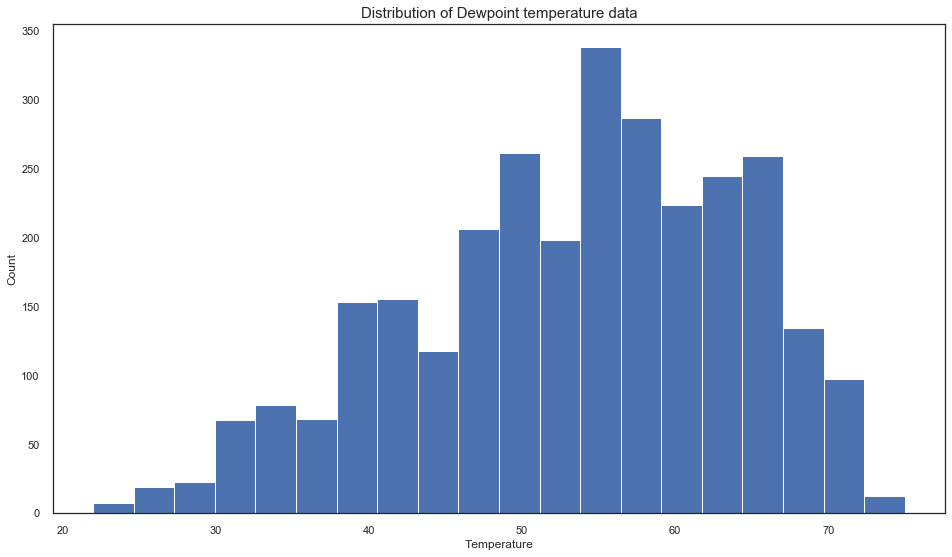

In [85]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['DewPoint'], bins = 20)
plt.title('Distribution of Dewpoint temperature data', size = 15)
plt.xlabel('Temperature')
plt.ylabel('Count')

The dewpoint data shows that there is a mean of 53 degrees, with a mode of 55 - 59 degrees. This shows that the distribution of DewPoint data is positively skewed.

### WetBulb

In [86]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[7]}</b> - {df_weather.WetBulb.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.WetBulb.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.WetBulb.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.WetBulb} has {n_nan} NaNs')

<b>WetBulb</b> - object

Values:

63    0.045856
65    0.044497
59    0.043818
61    0.041780
64    0.041101
62    0.040082
67    0.039742
66    0.038383
60    0.037704
69    0.036345
57    0.035666
70    0.034647
55    0.033628
71    0.033628
68    0.033288
58    0.032269
56    0.032269
52    0.026495
46    0.024457
72    0.024117
53    0.023438
47    0.020720
51    0.019361
73    0.019022
54    0.019022
50    0.018682
45    0.018003
48    0.017323
49    0.016984
74    0.016984
44    0.015285
42    0.011889
40    0.010530
43    0.010530
75    0.006793
41    0.006454
38    0.005774
39    0.005095
36    0.003057
77    0.002717
35    0.002717
76    0.002717
37    0.001698
34    0.001698
33    0.001698
M     0.001359
32    0.000340
78    0.000340
Name: WetBulb, dtype: float64




In [105]:
df_weather[df_weather['WetBulb'] == 'M']['WetBulb'].count()

4

In [106]:
df_weather['WetBulb'] = df_weather['WetBulb'].replace('M', np.nan)
df_weather['WetBulb'] = [float(x) for x in df_weather['WetBulb']]

Text(0, 0.5, 'Count')

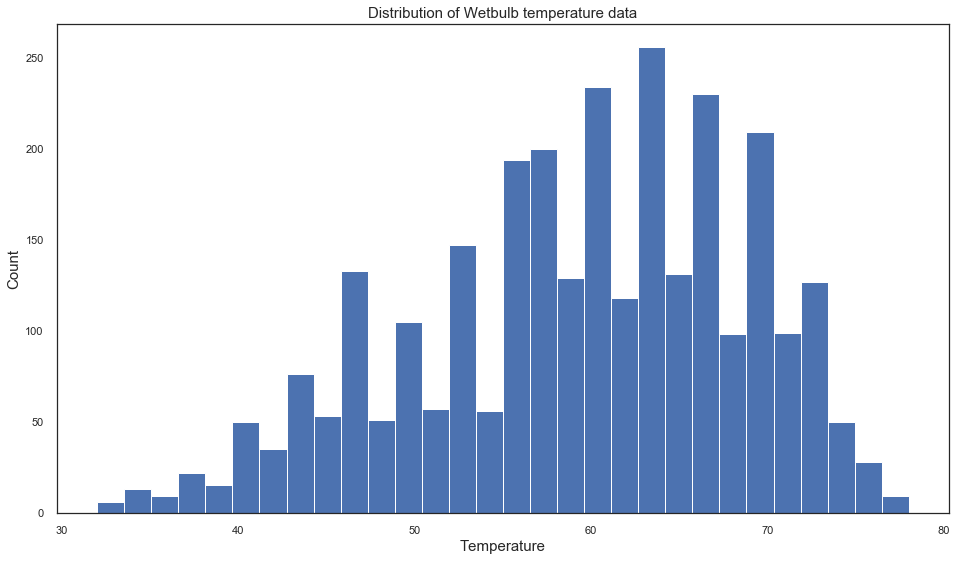

In [107]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['WetBulb'], bins = 30)
plt.title('Distribution of Wetbulb temperature data', size = 15)
plt.xlabel('Temperature', size = 15)
plt.ylabel('Count', size = 15)

In [108]:
print(df_weather['WetBulb'].mean(), df_weather['WetBulb'].min(),
      df_weather['WetBulb'].max(), df_weather['WetBulb'].median())

59.3108843537415 32.0 78.0 61.0


### Heat

In [90]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[8]}</b> - {df_weather.Heat.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Heat.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Heat.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Heat} has {n_nan} NaNs')

<b>Heat</b> - object

Values:

0     0.635190
4     0.029891
1     0.029212
2     0.027514
8     0.022758
3     0.022418
5     0.020720
15    0.019361
7     0.016644
12    0.016644
10    0.016304
11    0.016304
9     0.015625
13    0.015625
6     0.015285
14    0.012228
16    0.009851
20    0.009511
19    0.008152
18    0.008152
21    0.006454
17    0.005774
23    0.005095
22    0.004076
M     0.003736
24    0.002378
25    0.001698
26    0.001359
28    0.000679
29    0.000679
27    0.000679
Name: Heat, dtype: float64




In [91]:
df_weather['Heat'] = df_weather['Heat'].replace('M', np.nan)
df_weather['Heat'] = [float(x) for x in df_weather['Heat']]
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 22 columns):
Station        2944 non-null int64
Date           2944 non-null object
Tmax           2944 non-null int64
Tmin           2944 non-null int64
Tavg           2944 non-null object
Depart         2944 non-null object
DewPoint       2944 non-null int64
WetBulb        2944 non-null object
Heat           2933 non-null float64
Cool           2944 non-null object
Sunrise        2944 non-null object
Sunset         2944 non-null object
CodeSum        2944 non-null object
Depth          2944 non-null object
Water1         2944 non-null object
SnowFall       2944 non-null object
PrecipTotal    2944 non-null object
StnPressure    2944 non-null object
SeaLevel       2944 non-null object
ResultSpeed    2944 non-null float64
ResultDir      2944 non-null int64
AvgSpeed       2944 non-null object
dtypes: float64(2), int64(5), object(15)
memory usage: 506.1+ KB


Text(0, 0.5, 'Count')

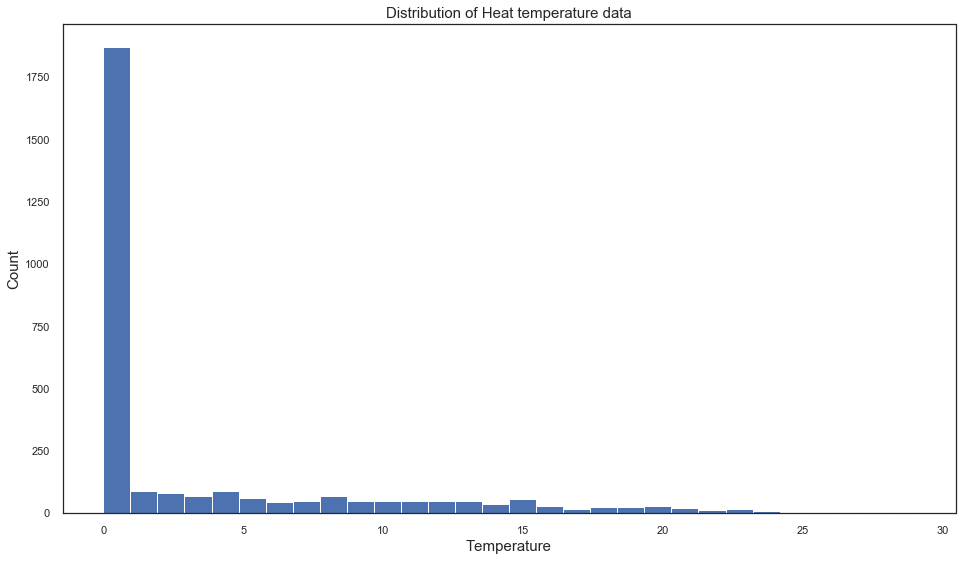

In [92]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['Heat'], bins = 30)
plt.title('Distribution of Heat temperature data', size = 15)
plt.xlabel('Temperature', size = 15)
plt.ylabel('Count', size = 15)

There are 11 missing data in the heat data. There is about 60% of the data having 0 value, leading it to be negative skewed.

### Cool

In [93]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[9]}</b> - {df_weather.Cool.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Cool.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Cool.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Cool} has {n_nan} NaNs')

<b>Cool</b> - object

Values:

 0    0.389606
 8    0.046875
 5    0.039742
12    0.039742
10    0.037364
 6    0.037024
 9    0.036345
 7    0.035326
 4    0.034986
13    0.034647
11    0.033967
 3    0.033628
14    0.033288
 1    0.031590
 2    0.030231
15    0.028533
16    0.018682
17    0.016304
18    0.011549
19    0.007133
20    0.005435
21    0.005435
M     0.003736
22    0.003057
26    0.001359
23    0.001359
24    0.001359
25    0.000679
28    0.000340
29    0.000340
27    0.000340
Name: Cool, dtype: float64




In [94]:
df_weather[df_weather['Cool'] == 'M']['Cool'].count()

11

In [95]:
df_weather['Cool'] = df_weather['Cool'].replace('M', np.nan)
df_weather['Cool'] = [ float(x) for x in df_weather['Cool']]

Text(0, 0.5, 'Count')

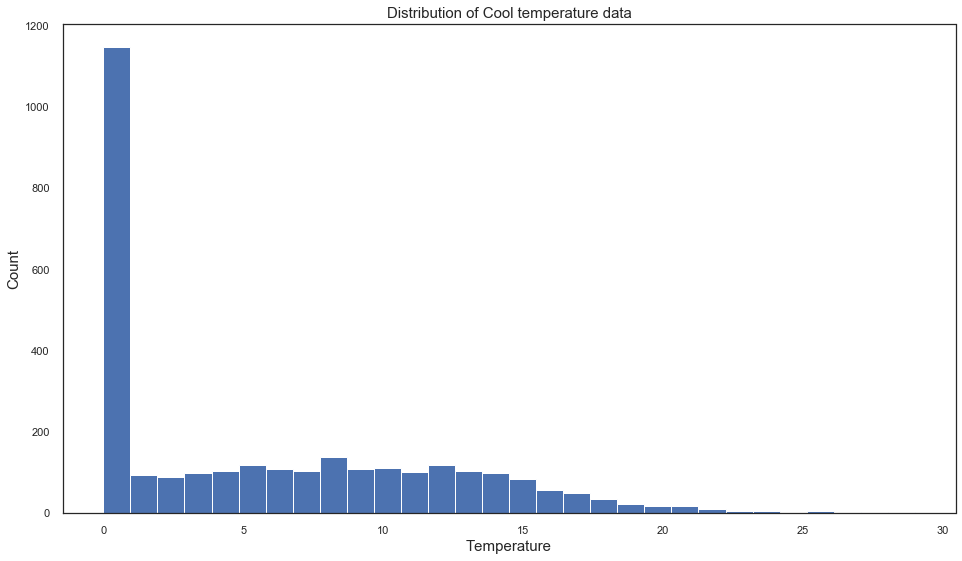

In [96]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['Cool'], bins = 30)
plt.title('Distribution of Cool temperature data', size = 15)
plt.xlabel('Temperature', size = 15)
plt.ylabel('Count', size = 15)

There are 11 missing Cool data. Similarly, there is a large amount of 0 value data, which makes the distribution negatively skewed.

### Sunrise

In [109]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[10]}</b> - {df_weather.Sunrise.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Sunrise.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Sunrise.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Sunrise} has {n_nan} NaNs')

<b>Sunrise</b> - object

Values:

-       0.500000
0416    0.035326
0417    0.021739
0419    0.013587
0422    0.010870
0418    0.010870
0420    0.010870
0425    0.010870
0428    0.008152
0421    0.008152
0423    0.008152
0433    0.008152
0429    0.005435
0448    0.005435
0441    0.005435
0431    0.005435
0439    0.005435
0438    0.005435
0430    0.005435
0434    0.005435
0435    0.005435
0444    0.005435
0447    0.005435
0443    0.005435
0436    0.005435
0427    0.005435
0432    0.005435
0424    0.005435
0446    0.005435
0437    0.005435
0426    0.005435
0442    0.005435
0529    0.002717
0532    0.002717
0604    0.002717
0517    0.002717
0456    0.002717
0453    0.002717
0543    0.002717
0528    0.002717
0533    0.002717
0531    0.002717
0510    0.002717
0514    0.002717
0544    0.002717
0536    0.002717
0600    0.002717
0451    0.002717
0555    0.002717
0616    0.002717
0553    0.002717
0550    0.002717
0458    0.002717
0520    0.002717
0623    0.002717
0452    0.002717
0450    0.002717
0513    0.002717
0526    0.0027

The sunrise data has a large proportion of missing values. However, the largest proportion of sunrises occurred around the 4 am.

### Sunset

In [110]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[11]}</b> - {df_weather.Sunset.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Sunset.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Sunset.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Sunset} has {n_nan} NaNs')

<b>Sunset</b> - object

Values:

-       0.500000
1931    0.032609
1930    0.019022
1929    0.016304
1925    0.010870
1928    0.010870
1923    0.010870
1927    0.010870
1920    0.008152
1926    0.008152
1918    0.008152
1916    0.008152
1851    0.005435
1903    0.005435
1908    0.005435
1917    0.005435
1915    0.005435
1858    0.005435
1859    0.005435
1906    0.005435
1910    0.005435
1856    0.005435
1855    0.005435
1922    0.005435
1902    0.005435
1904    0.005435
1907    0.005435
1909    0.005435
1924    0.005435
1852    0.005435
1921    0.005435
1914    0.005435
1911    0.005435
1919    0.005435
1849    0.005435
1913    0.005435
1834    0.002717
1703    0.002717
1826    0.002717
1735    0.002717
1912    0.002717
1901    0.002717
1819    0.002717
1843    0.002717
1715    0.002717
1720    0.002717
1815    0.002717
1734    0.002717
1853    0.002717
1707    0.002717
1854    0.002717
1824    0.002717
1741    0.002717
1857    0.002717
1809    0.002717
1751    0.002717
1657    0.002717
1749    0.002717
1649    0.0027

The sunrise data has a large proportion of missing values. However, the largest proportion of sunsets is around 7.30pm.

### CodeSum

In [111]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[12]}</b> - {df_weather.CodeSum.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.CodeSum.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.CodeSum.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.CodeSum} has {n_nan} NaNs')

<b>CodeSum</b> - object

Values:

                         0.546535
RA                       0.100543
RA BR                    0.080842
BR                       0.037364
TSRA RA BR               0.031250
BR HZ                    0.027514
RA DZ BR                 0.022079
TSRA RA                  0.014606
HZ                       0.013247
RA BR HZ                 0.012908
TSRA                     0.011549
RA DZ                    0.007473
TSRA BR                  0.007133
TS TSRA RA BR            0.006454
RA HZ                    0.005435
TS RA                    0.004416
TSRA RA BR HZ            0.004076
DZ BR                    0.003397
TS TSRA BR               0.003397
TS                       0.003397
DZ BR HZ                 0.003057
TS RA BR                 0.002717
TSRA BR HZ               0.002717
DZ                       0.002717
TS TSRA RA               0.002378
TS TSRA                  0.002378
TS TSRA BR HZ            0.002378
RA DZ BR HZ              0.002378
RA SN                    0.001359
TS BR         

There is a large proportion of empty data in this column of the dataframe. However, this does not represent missing data as this data records any weather phenomena that occurs, and thus on days that there is no data it represents that no phenomena observed.

### Depth

In [112]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[13]}</b> - {df_weather.Depth.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Depth.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Depth.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Depth} has {n_nan} NaNs')

<b>Depth</b> - object

Values:

M    0.5
0    0.5
Name: Depth, dtype: float64




Half of the depth values ae 0 while the other half is missing. This is as expected as this represents snow depth, which should not happen in summer.

### Water1

In [113]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[14]}</b> - {df_weather.Water1.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.Water1.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.Water1.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.Water1} has {n_nan} NaNs')

<b>Water1</b> - object

Values:

M    1.0
Name: Water1, dtype: float64




There is only missing data as this column codes for the water volume equivalent to snow fallen.



### SnowFall

In [114]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[15]}</b> - {df_weather.SnowFall.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.SnowFall.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.SnowFall.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.SnowFall} has {n_nan} NaNs')

<b>SnowFall</b> - object

Values:

M      0.500000
0.0    0.495584
  T    0.004076
0.1    0.000340
Name: SnowFall, dtype: float64




In [116]:

df_weather[(df_weather['SnowFall'] == '0.1')| (df_weather['SnowFall'] == '  T')]['SnowFall'].value_counts()

  T    12
0.1     1
Name: SnowFall, dtype: int64

There are 12 records with Trace amounts of Snow, and 1 with 0.1 inches of Snow. In addition, there is 50% of missing data.



### PrecipTotal

In [117]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[16]}</b> - {df_weather.PrecipTotal.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.PrecipTotal.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.PrecipTotal.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.PrecipTotal} has {n_nan} NaNs')

<b>PrecipTotal</b> - object

Values:

0.00    0.535666
  T     0.108016
0.01    0.043139
0.02    0.021399
0.03    0.015625
0.04    0.012228
0.05    0.010870
0.12    0.009511
0.08    0.009511
0.06    0.009171
0.07    0.007812
0.16    0.007133
0.09    0.007133
0.14    0.006793
0.11    0.006793
0.17    0.005774
0.28    0.005095
0.18    0.004755
0.13    0.004755
0.19    0.004755
0.15    0.004416
0.20    0.004416
0.26    0.003736
0.23    0.003736
0.25    0.003736
0.10    0.003397
0.24    0.003397
0.39    0.003057
0.21    0.003057
0.40    0.003057
0.31    0.003057
0.43    0.003057
0.29    0.003057
0.34    0.002717
0.22    0.002717
0.32    0.002717
0.50    0.002378
0.37    0.002378
0.59    0.002378
0.41    0.002378
0.45    0.002378
0.33    0.002378
0.30    0.002378
0.48    0.002378
0.65    0.002038
0.63    0.002038
0.84    0.002038
0.80    0.002038
0.27    0.002038
0.54    0.001698
0.85    0.001698
0.44    0.001698
0.93    0.001698
0.92    0.001698
0.36    0.001698
0.68    0.001698
0.72    0.001359
0.64    0.001359
0.51    0.0013

In [118]:
df_weather['PrecipTotal'].unique()


array(['0.00', '  T', '0.13', '0.02', '0.38', '0.60', '0.14', '0.07',
       '0.11', '0.09', '1.01', '0.28', '0.04', '0.08', '0.01', '0.53',
       '0.19', '0.21', '0.32', '0.39', '0.31', '0.42', '0.27', '0.16',
       '0.58', '0.93', '0.05', '0.34', '0.15', '0.35', 'M', '0.40',
       '0.66', '0.30', '0.24', '0.43', '1.55', '0.92', '0.89', '0.17',
       '0.03', '1.43', '0.97', '0.26', '1.31', '0.06', '0.46', '0.29',
       '0.23', '0.41', '0.45', '0.83', '1.33', '0.91', '0.48', '0.37',
       '0.88', '2.35', '1.96', '0.20', '0.25', '0.18', '0.67', '0.36',
       '0.33', '1.28', '0.74', '0.76', '0.71', '0.95', '1.46', '0.12',
       '0.52', '0.64', '0.22', '1.24', '0.72', '0.73', '0.65', '1.61',
       '1.22', '0.50', '1.05', '2.43', '0.59', '2.90', '2.68', '1.23',
       '0.62', '6.64', '3.07', '1.44', '1.75', '0.82', '0.80', '0.86',
       '0.63', '0.55', '1.03', '0.70', '1.73', '1.38', '0.44', '1.14',
       '1.07', '3.97', '0.87', '0.78', '1.12', '0.68', '0.10', '0.61',
       '0.

In [119]:
print('missing ', df_weather[df_weather['PrecipTotal']== 'M']['PrecipTotal'].count(),
      'trace ', df_weather[df_weather['PrecipTotal']== '  T']['PrecipTotal'].count())

missing  2 trace  318


There is 2 missing data, with 318 with Trace amounts of precipitation.



### StnPressure

In [120]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[17]}</b> - {df_weather.StnPressure.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.StnPressure.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.StnPressure.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.StnPressure} has {n_nan} NaNs')

<b>StnPressure</b> - object

Values:

29.34    0.043478
29.28    0.042120
29.26    0.041780
29.21    0.036345
29.31    0.036005
29.23    0.035326
29.36    0.032609
29.41    0.030910
29.39    0.030231
29.18    0.029212
29.29    0.029212
29.24    0.027853
29.33    0.027514
29.44    0.023777
29.38    0.021739
29.13    0.021739
29.15    0.021060
29.20    0.020380
29.47    0.019361
29.16    0.018682
29.25    0.017663
29.10    0.016644
29.35    0.016304
29.49    0.015625
29.08    0.013927
29.42    0.013927
29.19    0.013247
29.40    0.012568
29.30    0.012568
29.32    0.012228
29.17    0.011889
29.11    0.011209
29.46    0.011209
29.54    0.010870
29.27    0.010530
29.22    0.010530
29.52    0.009511
29.05    0.008492
29.51    0.008492
29.37    0.008152
29.00    0.008152
29.57    0.008152
29.03    0.007812
29.07    0.007473
29.14    0.006793
29.55    0.006454
28.97    0.006454
29.12    0.005774
29.59    0.005774
29.43    0.005774
29.45    0.005435
29.60    0.005095
29.02    0.005095
29.48    0.004755
29.09    0.004416
28.95    0

In [121]:
df_weather['StnPressure'].unique()


array(['29.10', '29.18', '29.38', '29.44', '29.39', '29.46', '29.31',
       '29.36', '29.40', '29.57', '29.62', '29.29', '29.21', '29.28',
       '29.20', '29.26', '29.33', '29.49', '29.54', '29.55', '29.23',
       '29.13', '29.19', '29.53', '29.60', '29.34', '29.41', '29.47',
       '29.51', '29.42', '29.43', '29.25', '29.03', '28.82', '28.87',
       '28.88', '29.16', '29.07', '28.84', '28.91', '29.24', 'M', '29.30',
       '29.12', '29.45', '29.56', '29.32', '29.05', '29.11', '29.06',
       '29.22', '29.08', '29.14', '29.37', '29.35', '29.15', '29.17',
       '29.48', '29.52', '29.27', '29.50', '28.59', '28.67', '28.75',
       '29.02', '29.79', '29.86', '29.63', '29.70', '28.95', '29.01',
       '28.79', '28.85', '28.97', '28.89', '28.94', '28.93', '28.98',
       '28.96', '29.00', '29.66', '29.09', '28.90', '29.04', '29.59',
       '29.65', '29.58', '29.61', '29.64', '29.71', '29.67', '28.80',
       '28.73', '29.68', '28.74', '28.55', '28.63', '28.92', '28.99',
       '28.81',

In [122]:
df_weather[df_weather['StnPressure'] == 'M']['StnPressure'].count()


4

In [123]:
df_weather['StnPressure'] = df_weather['StnPressure'].replace('M', np.nan)
df_weather['StnPressure'] = [float(x) for x in df_weather['StnPressure']]

Text(0, 0.5, 'Count')

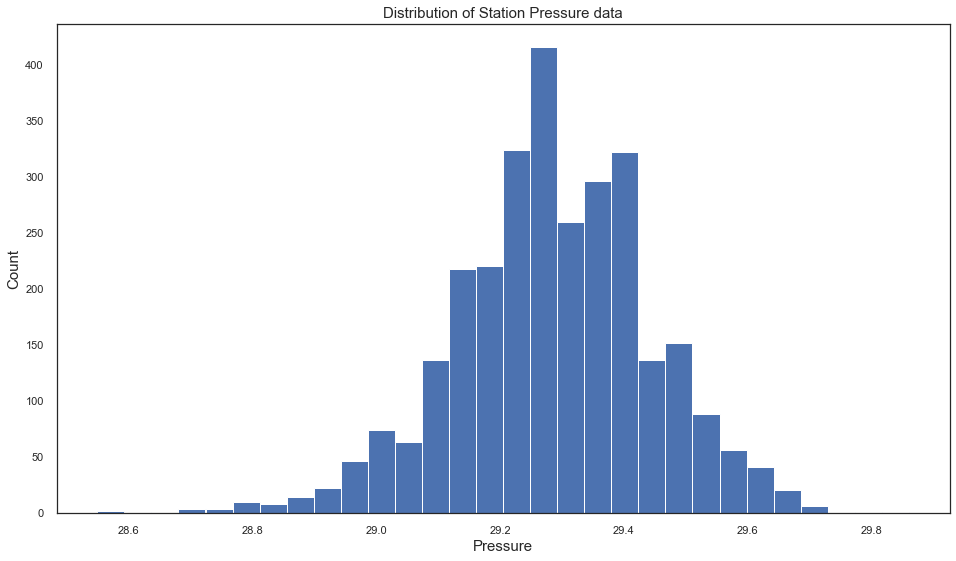

In [124]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['StnPressure'], bins = 30)
plt.title('Distribution of Station Pressure data', size = 15)
plt.xlabel('Pressure', size = 15)
plt.ylabel('Count', size = 15)

In [125]:
print(df_weather['StnPressure'].mean(), df_weather['StnPressure'].min(),
      df_weather['StnPressure'].max(), df_weather['StnPressure'].median())

29.28442857142859 28.55 29.86 29.28


There are 4 missing entries in the StnPressure data. The data looks normally distributed and the mean of the test lies with the median.

### SeaLevel

In [127]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[18]}</b> - {df_weather.SeaLevel.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.SeaLevel.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.SeaLevel.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.SeaLevel} has {n_nan} NaNs')

<b>SeaLevel</b> - object

Values:

30.00    0.032609
29.94    0.028872
29.98    0.028872
29.92    0.028193
29.89    0.027853
30.05    0.027514
29.91    0.027174
29.95    0.027174
30.02    0.027174
29.93    0.026834
29.96    0.026155
29.99    0.024796
29.97    0.024796
30.03    0.024457
30.01    0.024457
30.04    0.024457
30.06    0.023438
29.87    0.021060
29.90    0.020380
29.86    0.020041
29.85    0.019361
29.88    0.019022
30.08    0.018682
29.83    0.018003
30.10    0.018003
30.11    0.017663
30.07    0.017663
30.09    0.016984
29.84    0.015965
29.82    0.014946
29.81    0.013927
29.80    0.013927
30.13    0.013927
30.12    0.012228
29.77    0.011209
30.20    0.010870
30.17    0.009851
30.16    0.009511
29.79    0.009511
29.76    0.009511
30.25    0.008832
30.21    0.008492
30.15    0.008152
30.18    0.007812
29.73    0.007473
30.14    0.007133
29.69    0.007133
29.75    0.006793
30.23    0.006793
29.78    0.006454
29.70    0.006454
29.74    0.006114
30.22    0.005774
30.27    0.005435
30.26    0.005095
30.24    0

In [128]:
df_weather[df_weather['SeaLevel'] == 'M']['SeaLevel'].count()


9

In [129]:
df_weather['SeaLevel'] = df_weather['SeaLevel'].replace('M', np.nan)
df_weather['SeaLevel'] = [float(x) for x in df_weather['SeaLevel']]

Text(0, 0.5, 'Count')

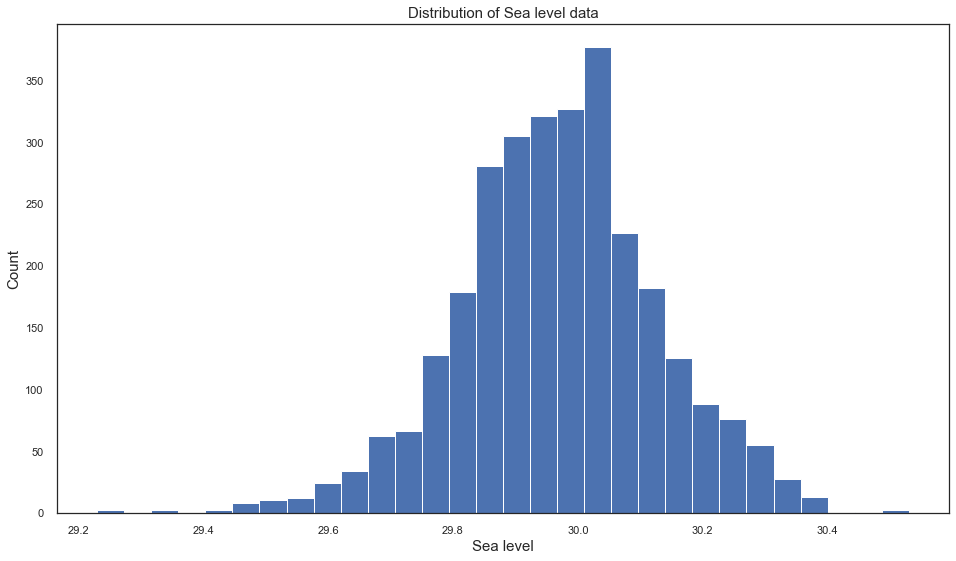

In [130]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['SeaLevel'], bins = 30)
plt.title('Distribution of Sea level data', size = 15)
plt.xlabel('Sea level', size = 15)
plt.ylabel('Count', size = 15)

In [131]:
print(df_weather['SeaLevel'].mean(), df_weather['SeaLevel'].min(),
      df_weather['SeaLevel'].max(), df_weather['SeaLevel'].median())

29.968129471890993 29.23 30.53 29.97


There is 9 missing data found in the SeaLevel data. The data looks normally distributed, with the median lying close to the mean.

### ResultSpeed

In [132]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[19]}</b> - {df_weather.ResultSpeed.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.ResultSpeed.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.ResultSpeed.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.ResultSpeed} has {n_nan} NaNs')

<b>ResultSpeed</b> - float64

Values:

5.9     0.016644
6.4     0.015965
6.2     0.014266
5.3     0.014266
4.9     0.012908
4.8     0.012568
6.0     0.012568
5.8     0.012568
6.3     0.012568
8.3     0.012228
5.2     0.012228
3.9     0.012228
4.4     0.012228
7.2     0.011889
7.0     0.011889
5.1     0.011549
6.1     0.011549
4.0     0.011209
4.7     0.011209
7.3     0.011209
3.1     0.010870
7.8     0.010870
6.8     0.010870
6.6     0.010870
4.5     0.010530
6.5     0.010530
7.4     0.010530
5.5     0.010190
9.4     0.009851
7.9     0.009851
5.7     0.009851
5.4     0.009851
8.9     0.009851
4.6     0.009511
7.5     0.009511
8.2     0.009511
4.1     0.009511
4.2     0.009511
5.6     0.009171
3.6     0.009171
6.9     0.009171
3.5     0.009171
2.8     0.009171
3.2     0.009171
3.8     0.009171
2.6     0.009171
3.3     0.008832
8.4     0.008832
10.0    0.008832
9.5     0.008832
8.6     0.008492
7.6     0.008492
3.4     0.008492
3.7     0.008492
10.5    0.008492
9.3     0.008152
8.7     0.007812
8.1     0.007812
4.3     0.0074

In [133]:
df_weather[df_weather['ResultSpeed'] == 'M']['ResultSpeed'].count()


0

Text(0, 0.5, 'Count')

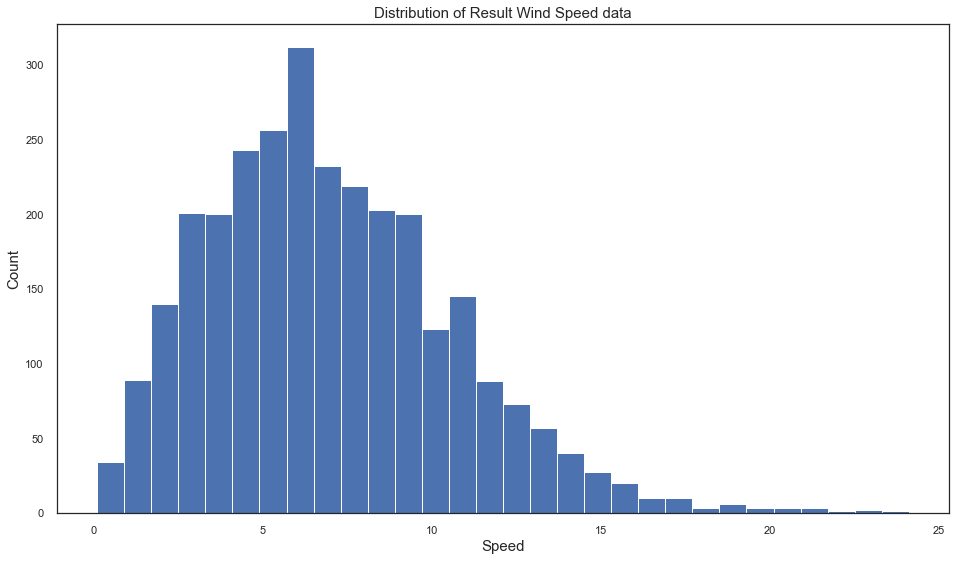

In [134]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['ResultSpeed'], bins = 30)
plt.title('Distribution of Result Wind Speed data', size = 15)
plt.xlabel('Speed', size = 15)
plt.ylabel('Count', size = 15)

In [135]:
print(df_weather['ResultSpeed'].mean(), df_weather['ResultSpeed'].min(),
      df_weather['ResultSpeed'].max(), df_weather['ResultSpeed'].median())


6.960665760869569 0.1 24.1 6.4


### ResultDir

In [136]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[20]}</b> - {df_weather.ResultDir.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.ResultDir.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.ResultDir.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.ResultDir} has {n_nan} NaNs')

<b>ResultDir</b> - int64

Values:

21    0.052989
3     0.047215
23    0.046875
19    0.046875
24    0.041440
4     0.041101
20    0.040082
22    0.039402
5     0.038383
6     0.037704
2     0.037364
25    0.036005
7     0.033288
26    0.031929
18    0.028533
27    0.028193
28    0.026495
36    0.024457
29    0.024117
8     0.023098
30    0.021739
9     0.021399
1     0.021060
31    0.020720
17    0.020041
11    0.020041
16    0.018682
12    0.016984
34    0.016644
14    0.016644
32    0.015965
10    0.015285
13    0.012908
35    0.012568
15    0.012228
33    0.011549
Name: ResultDir, dtype: float64




In [137]:
df_weather[df_weather['ResultDir'] == 'M']['ResultDir'].count()


0

Text(0, 0.5, 'Count')

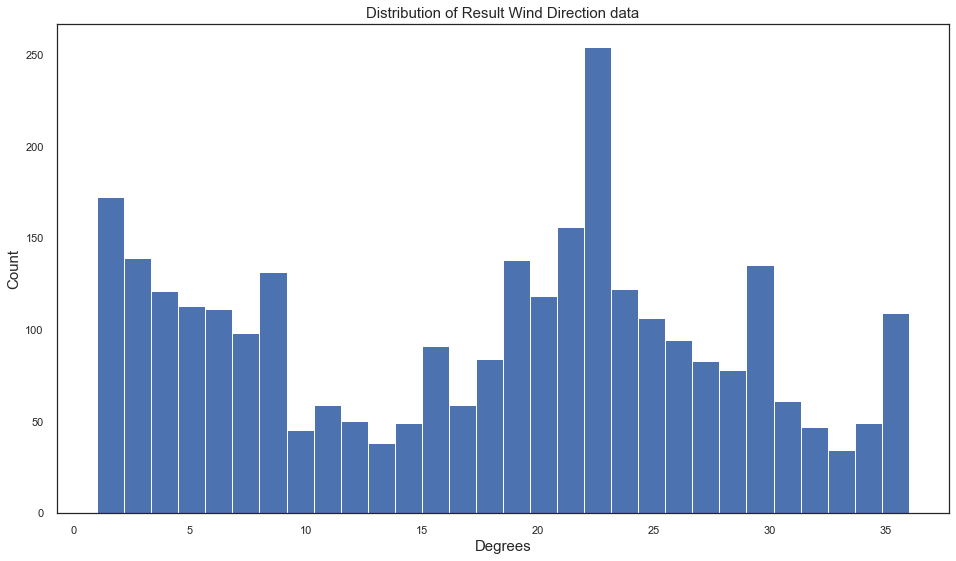

In [138]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['ResultDir'], bins = 30)
plt.title('Distribution of Result Wind Direction data', size = 15)
plt.xlabel('Degrees', size = 15)
plt.ylabel('Count', size = 15)

### AvgSpeed

In [139]:
# Display object type and values for each feature
display(Markdown(f'<b>{df_weather.columns[21]}</b> - {df_weather.AvgSpeed.dtype}'))
display(Markdown(f'Values:'))
print(f'{df_weather.AvgSpeed.value_counts(normalize=True)}\n')
print()
n_nan = df_weather.AvgSpeed.isnull().sum()
if n_nan > 0:
    print(f'{df_weather.AvgSpeed} has {n_nan} NaNs')

<b>AvgSpeed</b> - object

Values:

6.9     0.021399
5.8     0.020380
7.4     0.018682
8.1     0.016644
7.0     0.015965
7.7     0.014946
9.2     0.014946
8.0     0.014606
7.3     0.014266
6.0     0.014266
9.1     0.013927
6.8     0.013927
5.9     0.013927
9.0     0.013587
11.5    0.013587
7.9     0.013587
7.2     0.013247
7.5     0.013247
6.5     0.013247
6.2     0.013247
6.6     0.012908
4.6     0.012908
7.8     0.012908
10.1    0.012568
6.4     0.012228
6.3     0.012228
8.4     0.011889
8.6     0.011889
5.4     0.011889
6.1     0.011889
4.9     0.011549
9.6     0.011549
7.1     0.011209
6.7     0.011209
8.8     0.011209
9.9     0.010870
8.5     0.010870
5.7     0.010530
8.2     0.010530
10.8    0.010530
8.3     0.010530
5.5     0.009851
9.3     0.009851
7.6     0.009511
10.5    0.009511
9.5     0.009511
5.2     0.009511
5.0     0.009511
8.9     0.009171
8.7     0.008832
10.0    0.008832
11.2    0.008832
9.4     0.008832
9.7     0.008832
10.3    0.008492
10.7    0.008152
4.8     0.008152
9.8     0.008152
5.6     0.0081

In [140]:
df_weather[df_weather['AvgSpeed'] == 'M']['AvgSpeed'].count()


3

In [141]:
df_weather['AvgSpeed'] = df_weather['AvgSpeed'].replace('M', np.nan)
df_weather['AvgSpeed'] = [float(x) for x in df_weather['AvgSpeed']]

Text(0, 0.5, 'Count')

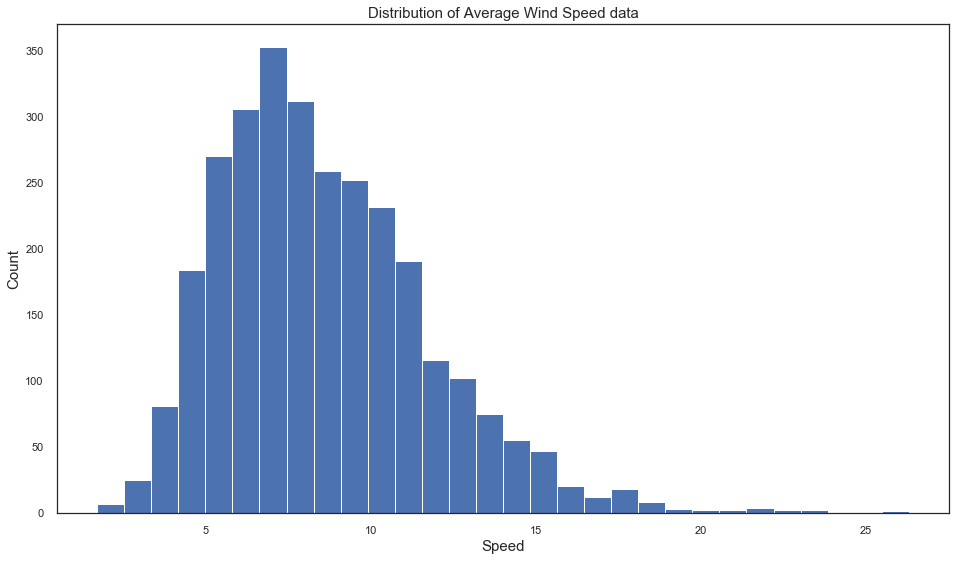

In [142]:
plt.figure(figsize = (16,9))
plt.hist(df_weather['AvgSpeed'], bins = 30)
plt.title('Distribution of Average Wind Speed data', size = 15)
plt.xlabel('Speed', size = 15)
plt.ylabel('Count', size = 15)


In [143]:
print(df_weather['AvgSpeed'].mean(), df_weather['AvgSpeed'].min(),
      df_weather['AvgSpeed'].max(), df_weather['AvgSpeed'].median())

8.580448826929606 1.7 26.3 8.1


The mean average speed for wind is 8.5, and the data is negatively skewed.